In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from plotly.offline import init_notebook_mode, iplot, plot
import plotly as py
init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.express as px
import plotly.figure_factory as ff

import matplotlib.pyplot as plt
import os

In [ ]:
from google.colab import files
data.csv = files.upload()

Saving data.csv to data.csv


NameError: ignored

# Требования: 
- во всех графиках должны быть подписи чере title, legend, etc... 
- Убедитесь, что после сохранения ноутбука графики всё ещё видно, если открыть ноутбук заново, если не видно, то напишите мне @kirizhik 
- Можно баловаться с цветами, чтобы было **K P A C U B O**, но **не вырвеглазно**, пожалуйста

In [ ]:
df = pd.read_csv('data.csv', index_col = 0)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18207 entries, 0 to 18206
Data columns (total 88 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   ID                        18207 non-null  int64  
 1   Name                      18207 non-null  object 
 2   Age                       18207 non-null  int64  
 3   Photo                     18207 non-null  object 
 4   Nationality               18207 non-null  object 
 5   Flag                      18207 non-null  object 
 6   Overall                   18207 non-null  int64  
 7   Potential                 18207 non-null  int64  
 8   Club                      17966 non-null  object 
 9   Club Logo                 18207 non-null  object 
 10  Value                     18207 non-null  object 
 11  Wage                      18207 non-null  object 
 12  Special                   18207 non-null  int64  
 13  Preferred Foot            18159 non-null  object 
 14  Intern

In [ ]:
df.columns

Index(['ID', 'Name', 'Age', 'Photo', 'Nationality', 'Flag', 'Overall',
       'Potential', 'Club', 'Club Logo', 'Value', 'Wage', 'Special',
       'Preferred Foot', 'International Reputation', 'Weak Foot',
       'Skill Moves', 'Work Rate', 'Body Type', 'Real Face', 'Position',
       'Jersey Number', 'Joined', 'Loaned From', 'Contract Valid Until',
       'Height', 'Weight', 'LS', 'ST', 'RS', 'LW', 'LF', 'CF', 'RF', 'RW',
       'LAM', 'CAM', 'RAM', 'LM', 'LCM', 'CM', 'RCM', 'RM', 'LWB', 'LDM',
       'CDM', 'RDM', 'RWB', 'LB', 'LCB', 'CB', 'RCB', 'RB', 'Crossing',
       'Finishing', 'HeadingAccuracy', 'ShortPassing', 'Volleys', 'Dribbling',
       'Curve', 'FKAccuracy', 'LongPassing', 'BallControl', 'Acceleration',
       'SprintSpeed', 'Agility', 'Reactions', 'Balance', 'ShotPower',
       'Jumping', 'Stamina', 'Strength', 'LongShots', 'Aggression',
       'Interceptions', 'Positioning', 'Vision', 'Penalties', 'Composure',
       'Marking', 'StandingTackle', 'SlidingTackle', 'GKDiv

In [ ]:
df[['Wage']].head(10)

,Wage
0,€565K
1,€405K
2,€290K
3,€260K
4,€355K
5,€340K
6,€420K
7,€455K
8,€380K
9,€94K


In [ ]:
k = len(df.columns)

In [ ]:
sum((df.dtypes == 'float64'))+sum((df.dtypes == 'int64'))

43

# Заполните пропуски в утверждениях 

- В датасете 88 переменных 

- Из них числовых 43


# Изучите распределение возростов с помощью Age [px.histogram](https://plotly.com/python/histograms/), изучите [более продвинутые методы](https://plotly.com/python/distplot/) визуализации распределений 

In [ ]:
def Hist_TopN(n_Nat):
  df1 = df.loc[list(map(lambda x: x in df.Nationality.value_counts()[:n_Nat].index, df['Nationality']))]
  fig = px.histogram(df1, x="Age", color="Nationality", 
                    marginal="box", 
                    title='Distribution of the top nationalities by age', 
                    labels={
                      "Age": "Age distribution (years)",
                      "Nationality": "Nationality"})
  fig.update_layout(bargap=0.2)
  fig.show(renderer='colab')
Hist_TopN(3) #функция показывает возростное распределение топ n национальностей

In [ ]:
#переводим значения Wage в Float
print(set(map(lambda x: x[-1],df['Wage'])))

df['WageFloat'] = np.nan
for i in range(len(df['Wage'])):
  if df['Wage'][i][-1] == '0': df['WageFloat'][i] = 0
  else: df['WageFloat'][i] = float(df['Wage'][i][1:-1])
df['WageFloat']

{'0', 'K'}


0        565.0
1        405.0
2        290.0
3        260.0
4        355.0
         ...  
18202      1.0
18203      1.0
18204      1.0
18205      1.0
18206      1.0
Name: WageFloat, Length: 18207, dtype: float64

In [ ]:
#делим значения WageFloat на 3 части
WageFloat_list = []
for i in df['WageFloat']:
  if i <=df['WageFloat'].quantile(0.33): WageFloat_list.append('small')
  elif (i > df['WageFloat'].quantile(0.33))&(i <= df['WageFloat'].quantile(0.66)):WageFloat_list.append('medium')
  else: WageFloat_list.append('big')
df['WageFloat_list'] = WageFloat_list

In [ ]:
fig = px.histogram(df, x="Age", color="WageFloat_list",
                   marginal="box", 
                    title='Distribution of salary levels by age', 
                    labels={
                      "Age": "Age distribution (years)",
                      "Wage": "Wage"},
                    hover_data=df.columns)
fig.update_layout(bargap=0.2)
fig.show(renderer='colab')
#распределение WageFloat по возрастам

# Визуализируйте соотношенеие между левшами и правшами (? сами найдите необходимую колонку в данных, считаем, что левша-правша ~ предпочтительная нога для ударов )

In [ ]:
fig = px.histogram(df, x="Preferred Foot", 
                   title="The ratio between left-handers and right-handers", 
                   labels={"Preferred Foot": "Preferred Foot"})
fig.update_layout(bargap=0.2)
fig.show(renderer='colab')
#здесь все просто, левшей меньше

# Визуализируйте Международный Рейтинг футболистов (International Reputation), ассоциирован ли он с национальностью? футбольным клубом? 

![Игроки](Players.png "Title")


In [ ]:
df[['Name','Age','Overall','Potential','Club','Value','Wage','International Reputation']].sort_values(by='International Reputation', ascending=False) #флаги немного битые ссылки

,Name,Age,Overall,Potential,Club,Value,Wage,International Reputation
0,L. Messi,31,94,94,FC Barcelona,€110.5M,€565K,5.0
2,Neymar Jr,26,92,93,Paris Saint-Germain,€118.5M,€290K,5.0
109,Z. Ibrahimović,36,85,85,LA Galaxy,€14M,€15K,5.0
1,Cristiano Ronaldo,33,94,94,Juventus,€77M,€405K,5.0
7,L. Suárez,31,91,91,FC Barcelona,€80M,€455K,5.0
...,...,...,...,...,...,...,...,...
13279,P. Mazzocchi,22,62,69,Perugia,€350K,€1K,NaN
13280,Y. Ammour,19,62,77,Montpellier HSC,€650K,€2K,NaN
13281,Jwa Joon Hyeop,27,62,62,Gyeongnam FC,€300K,€1K,NaN
13282,O. Marrufo,25,62,65,Tiburones Rojos de Veracruz,€375K,€2K,NaN


In [ ]:
for i in [1,2,3,4,5]:
  fig = px.histogram(df.loc[(df['International Reputation'].notna())&(df['International Reputation']==i)], x="Nationality", color='International Reputation', 
                   title="International Rating of football players by nationality", 
                   labels={"International Reputation": "International Reputation"})
  fig.update_layout(bargap=0.2)
  fig.show(renderer='colab')



Как показывают боксплоты распределение в рейтинге зависит от национальности, так как при соответсвующих значениях национальностей получаем различные колличества игроков с одинаковым рейтингом, поэтому рейтинг может быть ассоцирован с национальностей

In [ ]:
for i in [1,2,3,4,5]:
  fig = px.histogram(df.loc[(df['International Reputation'].notna())&(df['International Reputation']==i)], x="Club", color='International Reputation', 
                   title="International Rating of football players by Club", 
                   labels={"International Reputation": "International Reputation"})
  fig.update_layout(bargap=0.2)
  fig.show(renderer='colab')

Аналагично с распределением рейтинга по клубам


# Есть ли зависимость между потенциалом (Potential) и Международным Рейтингом футболистов (International Reputation)? Визуализируте её. Влияет ли на потенциал игровая нога? Почему так может случиться? (картинка в тему)

![Коазуация или корреляция?](causuation.png "???")

In [ ]:
df.corr()['Potential']['International Reputation'] #надеемся и верим что распределение нормальное

0.37299269990481765



```
df.corr()['Potential']['International Reputation'] = 0.37299269990481765 -> Корреляция положительная низкая
```

 (мем-стикер с прошлой сессии, да и с любой сессии)

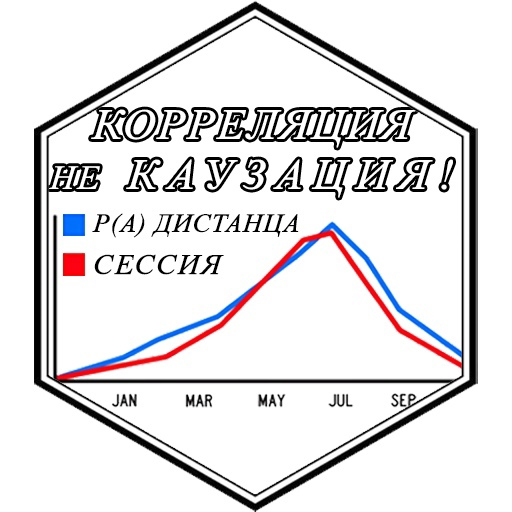

In [ ]:
fig = px.histogram(df.loc[df['International Reputation'].notna()], x="Potential", color='International Reputation', 
                   title="The relationship between Potential and the International Rating of football players (International Reputation)", 
                   labels={"Potential": "Potential"})
fig.update_layout(bargap=0.2)
fig.show(renderer='colab')


Как можно заметить распределение при повышении значения рейтинга смещается вправо, из чего можно предволожить, что игроки с более высоким International Reputation имеют больший потенциал


In [ ]:
fig = px.histogram(df.loc[df['Preferred Foot'].notna()], x="Potential", color='Preferred Foot', 
                   title="The relationship between Preferred Foot and the Potential", 
                   labels={"Preferred Foot": "Preferred Foot"})
fig.update_layout(bargap=0.2)
fig.show(renderer='colab')

Как можно заметить на Potential не влияет показатель Preferred Foot

# Теперь пройдёмся по показателям игроков... 
### Есть ли зависимость Выносливости (Stamina) и Силы (Strength) игроков? какая? точно зависимость? 


In [ ]:
df.corr()['Stamina']['Strength'] #надеемся и верим что распределение нормальное

0.26269370713482004



```
df.corr()['Stamina']['Strength'] = 0.26269370713482004 ->слабая зависимость
```



In [ ]:
fig = px.scatter(df, x="Stamina", y="Strength", title="Scatter plot")
fig.show(renderer='colab')

# Зависит ли Стоимость игрока стоимость (Value) игрока от его "финтов" (Skill Moves)? 

In [ ]:
print(set(map(lambda x: x[-1],df['Value'])))

#переводим в Float значения Value
df['ValueFloat'] = np.nan
for i in range(len(df['Value'])):
  if df['Value'][i][-1] == '0':
    df['ValueFloat'][i] = 0
  elif df['Value'][i][-1] == 'K':
    df['ValueFloat'][i] = float(df['Value'][i][1:-1])
  else: df['ValueFloat'][i] = float(df['Value'][i][1:-1])*1000
df['ValueFloat']

{'M', 'K', '0'}


0        110500.0
1         77000.0
2        118500.0
3         72000.0
4        102000.0
           ...   
18202        60.0
18203        60.0
18204        60.0
18205        60.0
18206        60.0
Name: ValueFloat, Length: 18207, dtype: float64

df.corr()['Skill Moves']['ValueFloat'] = 0.3156514601779395 -> малая


In [ ]:
df.corr()['Skill Moves']['ValueFloat'] #надеемся и верим на нормальное распределение

0.3156514601779395

In [ ]:
fig = px.box(df, x="Skill Moves", y="ValueFloat", log_y=True, title="Box plots the cost of the player the cost (Value) of the player from his feints")
fig.show(renderer='colab')

# Покажите распределеняи основных характеристик игроков: Рост, Вес, Возраст по позициям (Position), сделайте выводы...


In [ ]:
#переводим рост в метрическую ссстему, так легче с ним работать
df1 = df.loc[df['Height'].notna()]
df1['HeightM'] = np.nan
df1.reindex(range(len(df1['HeightM'])))
for i in range(len(df1['Height'])):
  t = df1['Height'].iloc[i].split("'")
  df1['HeightM'].iloc[i] = round((float(t[0])+float(t[1])/12)*0.3048,2)


In [ ]:
#разделям игроков на 3 равные группы
for i in df1['HeightM']:
  if i <=df1['HeightM'].quantile(0.33): HeightM_list.append('small')
  elif (i > df1['HeightM'].quantile(0.33))&(i <= df1['HeightM'].quantile(0.66)):HeightM_list.append('medium')
  else: HeightM_list.append('big')
df1['HeightM_list'] = HeightM_list

In [ ]:
fig = px.histogram(df1, x="Position", color='HeightM_list', 
                   title="The relationship between Position and Heigh of football players", 
                   labels={"Position": "Position"})
fig.update_layout(bargap=0.2)
fig.show(renderer='colab')

Наиболее требовательны к росту позиции: LCB, CK, CB, RCB

Безразлична к росту позиция ST

Низкие футболисты, как правило играют: LW, RCM, CAM, RM, LM

In [ ]:
df2 = df.loc[df['Weight'].notna()]
df2['WeightN'] = np.nan
df2['WeightN'] = list(map(lambda x: int(x[:-3]),df2['Weight']))
df2['WeightN']

0        159
1        183
2        150
3        168
4        154
        ... 
18202    134
18203    170
18204    148
18205    154
18206    176
Name: WeightN, Length: 18159, dtype: int64

In [ ]:
WeightN_list = []
for i in df2['WeightN']:
  if i <=df2['WeightN'].quantile(0.33): WeightN_list.append('small')
  elif (i > df2['WeightN'].quantile(0.33))&(i <= df2['WeightN'].quantile(0.66)):WeightN_list.append('medium')
  else: WeightN_list.append('big')
df2['WeightN_list'] = WeightN_list

In [ ]:
fig = px.histogram(df2, x="Position", color='WeightN_list', 
                   title="The relationship between Position and Weight of football players", 
                   labels={"Position": "Position"})
fig.update_layout(bargap=0.2)
fig.show(renderer='colab')

Рост игроков коррелирует с их весом, поэтому распределения остаются схожими


In [ ]:
Age_list = []
for i in df['Age']:
  if i <=df['Age'].quantile(0.33): Age_list.append('small')
  elif (i > df['Age'].quantile(0.33))&(i <= df['Age'].quantile(0.66)):Age_list.append('medium')
  else: Age_list.append('big')
df['AgeL'] = Age_list

In [ ]:
fig = px.histogram(df, x="Position", color='AgeL', 
                   title="The relationship between Position and Ageg of football players (International Reputation)", 
                   labels={"Position": "Position"})
fig.update_layout(bargap=0.2)
fig.show(renderer='colab')

Возвраст не является определяющим критерием позиции игрока в футболе, так как 
мы видим сходие соотношения 3 групп на гистограмме 

# Есть ли зависимость скорости (SprintSpeed) от веса и роста? А от национальности?  

In [ ]:
df1.corr()['SprintSpeed']['HeightM'] #надеемся и верим на нормальное распределение

-0.466627318465547

In [ ]:
fig = px.scatter(df1, x="SprintSpeed", y="HeightM", title="Scatter plot", log_y=True)
fig.show(renderer='colab')

Средняя отрицательная => больший вес характеризуется снижением скорости

In [ ]:
df2.corr()['SprintSpeed']['WeightN'] #надеемся и верим на нормальное распределение

-0.41093630221159777

In [ ]:
fig = px.scatter(df2, x="SprintSpeed", y="WeightN", title="Scatter plot", log_y=True)
fig.show(renderer='colab')

Средняя отрицательная => больший рост характеризуется снижением скорости

# Под какими номерами чаще всего играют нападающие? Визуализируйте частотность  

In [ ]:
nbins=df[df['Position']=='ST']['Jersey Number'].value_counts()
nbins

9.0     364
19.0    127
11.0    125
10.0     96
18.0     87
       ... 
93.0      1
67.0      1
52.0      1
96.0      1
71.0      1
Name: Jersey Number, Length: 80, dtype: int64

In [ ]:
fig = px.histogram(df[df['Position']=='ST'], x="Jersey Number", nbins=100,#100 т к существовала ситсема, заставляющая номера "слипаться"
                   title="Distribution of attacking numbers)", 
                   labels={"Position": "Position"})
fig.update_layout(bargap=0.2)
fig.show(renderer='colab')


Объяснение почему 9 номер нашел выкладки в интернете https://uafootball.org.ua/po-kakomu-printsipu-futbolistam-prisvaivayut-nomera/ поэтому же и 99 и 19


# Есть ли за зависимость **силы удара** (ShotPower) от **ведущей ноги**? от **агрессивности** (Aggression)? 


In [ ]:
df['PFLogical'] = np.nan
df['PFLogical'] = list(map(lambda x: 1 if x == 'Left' else 0,df['Preferred Foot']))

In [ ]:
df.corr()['ShotPower']['PFLogical']

0.07404465114047575

In [ ]:
fig = px.box(df, x="Preferred Foot", y="ShotPower", title="The boxes display the distribution of Shot Power from the leading leg")
fig.show(renderer='colab')

корреляция близка к нулю, зависимость между силой удара и ведущей ногой не наблюдается

In [ ]:
df.corr()['ShotPower']['Aggression'] #надеемся и верим на нормальное распределение

0.49138588639543157

In [ ]:
fig = px.scatter(df, x="ShotPower", y="Aggression", title="Scatter plot")
fig.show(renderer='colab')

Средняя положительная => есть зависмисть между силой удара и агрессивностью, чем выше один показатель, тем, как правило, выше другой


# Найдите суммарную стоимость игроков в каждом клубе. Визуализируйте соотношение сумарной стоимости топ 10 клубов. 

In [ ]:
a = df.loc[df['Club'].notna()]['Club']
b = df.groupby(['Club']).sum().sort_values(by='ValueFloat', ascending=False)[:10]['ValueFloat'].index
t = list(map(lambda x: x in b, a)) # список индексов принадлежащих игрокам входящих в топ 10 клубов без nan

In [ ]:
df.groupby(['Club']).sum().sort_values(by='ValueFloat', ascending=False)[:10]['ValueFloat'].index #В тысячах

Club
Real Madrid            874425.0
FC Barcelona           852600.0
Manchester City        786555.0
Juventus               704475.0
FC Bayern München      679025.0
Atlético Madrid        644525.0
Paris Saint-Germain    625325.0
Tottenham Hotspur      618450.0
Chelsea                606815.0
Manchester United      588850.0
Name: ValueFloat, dtype: float64

In [ ]:
fig = px.bar(df.loc[df['Club'].notna()].loc[t].sort_values(by='Club'),x="Club",y="ValueFloat",title="barplot top-10 Club")
fig.update_layout(bargap=0.2)
fig.show(renderer='colab')

# Есть ли зависимость между продолжительностью контракта игрока и его стоимость? 

In [ ]:
dftime = df.loc[df['Joined'].notna()]
dftime['JoinedFrom'] = np.nan
dftime['JoinedFrom'] = list(map(lambda x: 2021-int(x.split(',')[1][1:]), dftime['Joined']))


In [ ]:
fig = px.box(dftime, x="JoinedFrom", y="ValueFloat", title="The relationship between the duration of the player's contract and its cost",log_y=True)
fig.show(renderer='colab')

In [ ]:
dftime.corr()['JoinedFrom']['ValueFloat'] #надеемся и верим на нормальное распределение


0.11774721142788978

корреляция близка к нулю, зависимость между продолжительностью контракта и чтоимостью не наблюдается

# В какой год будет больше всего свободных игроков на рынке (исходя из этих данных)? визуализируйте зависимость 

In [ ]:
fig = px.histogram(df,x="Contract Valid Until",title="Histogram of free players by year")
fig.update_layout(bargap=0.2)
fig.show(renderer='colab')

# Есть ли зависмость потенциала (Potential) игрока от возраста? Всегда ли молодые игроки обладают большим потенциалом? 

In [ ]:
fig = px.histogram(df, x="Potential", color='AgeL', 
                   title="The relationship between Potential and Age_groups of football players", 
                   labels={"Overall": "Overall"})
fig.update_layout(bargap=0.2)
fig.show(renderer='colab')

In [ ]:
df.corr()['Potential']['Age'] #надеемся и верим на нормальное распределение

-0.25331210741096527

Заисимость малая, но отрицательная. Как видно из графика с возврастом распределение потенциала смещается левее, что подтверждает рассчет корреляции. Однако если отвечать на вопрос "Всегда ли молодые игроки обладают большим потенциалом?" можно совершенно спокойно дават ответ: не всегда, молодые игроки могут обладать малым потенциалом


# Есть ли зависимость рейтинга игрока (Overall) от возраста? Когда у игроков "пик" карьеры? Игроков какого возраста больше всего с рейтингом 90+?  

In [ ]:
fig = px.histogram(df, x="Overall", color='AgeL', 
                   title="The relationship between Overall and Age_groups of football players", 
                   labels={"Overall": "Overall"})
fig.update_layout(bargap=0.2)
fig.show(renderer='colab')

In [ ]:
df.corr()['Overall']['Age']#надеемся и верим на нормальное распределение

0.4523495214563423

Корреляция средняя положительная, гистограмма также показывает, что наиболее рейтенговые футболисты среднего и старшего возраста


In [ ]:
list(df[df['Overall']>90]['Age'].value_counts().index)[0]

27

Игроков 27 лет больше всего: 3 штуки

# Насколько средняя зарплата (Wage) игроков с рейтингом (Overall) 90+ больше средней зарплаты с рейтингом [80 - 90]? Визуализируйте возможную зависимость

In [ ]:
print(set(map(lambda x: x[-1],df['Wage'])))
df['WageFloat'] = np.nan
for i in range(len(df['Wage'])):
  if df['Wage'][i][-1] == '0': df['WageFloat'][i] = 0
  else: df['WageFloat'][i] = float(df['Wage'][i][1:-1])
df['WageFloat']

{'0', 'K'}


0        565.0
1        405.0
2        290.0
3        260.0
4        355.0
         ...  
18202      1.0
18203      1.0
18204      1.0
18205      1.0
18206      1.0
Name: WageFloat, Length: 18207, dtype: float64

In [ ]:
print(df[df['Overall']>90]['WageFloat'].mean() - df[(df['Overall']>80)&(df['Overall']<=90)]['WageFloat'].mean())


289.0716845878136


Из рассчетов зарплата выше на 289 тысяч

In [ ]:
Wage_list = []
for i in df['WageFloat']:
  if i <=df['WageFloat'].quantile(0.33): Wage_list.append('small')
  elif (i > df['WageFloat'].quantile(0.33))&(i <= df['WageFloat'].quantile(0.66)):Wage_list.append('medium')
  else: Wage_list.append('big')
df['WageL'] = Age_list

In [ ]:
fig = px.histogram(df[df['Overall']>80], x="Overall", color='WageL', 
                   title="The relationship between Overall Wage_groups of football players", 
                   labels={"Overall": "Overall"})
fig.update_layout(bargap=0.2)
fig.show(renderer='colab')

Благодарю за внимание!